In [30]:
import geopandas as gpd
import pandas as pd
import numpy as np
from math import pi
import folium
%matplotlib inline
import shapely
from shapely.geometry import *
import pysal as ps
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.transforms import blended_transform_factory
import math
from scipy.optimize import minimize_scalar


In [3]:
blocks = gpd.read_file('Oakland_Blocks.shp').set_index('GEOID10')['geometry']


In [4]:
def compactness_measure(x):
    block_area = x.area
    block_perimeter = x.length
    block_radius = block_perimeter / (2*pi)
    circ_area = pi*block_radius**2
    return block_area/circ_area
cp1 = blocks.apply(compactness_measure)

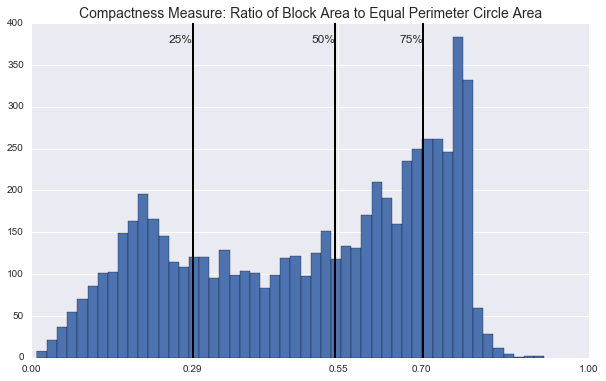

In [5]:
fig, ax = plt.subplots()
cp1.hist(bins=50, ax=ax)
t=ax.set_title('Compactness Measure: Ratio of Block Area to Equal Perimeter Circle Area', fontsize=14)
tform = blended_transform_factory(ax.transData, ax.transAxes)

qs = cp1.quantile([.25, .5, .75])
for i,q in qs.iteritems():
    label="{0:.0f}%".format(i * 100)
    ax.axvline(q, color='black', linewidth=2, linestyle='-')
    ax.annotate(label, xy=(q, 0), xycoords=tform, 
            xytext=(q, 0.95), textcoords=tform,
            ha='right', va='center', fontsize=12)
fig.set_size_inches(10,6)

a=ax.set_xticks(np.append([0,1,],qs.round(2)))



### Area to Perimeter Ratio 

With area / length measurement. Slivers have small areas relative to their length

More likely to be classified as a sliver if overall size is smaller (it is not a unitless measure)

area increases faster than length, so ratio gets larger for larger blocks and they are therefore less liekly to be classified as slivers if they are big areas (reasons why the stuff in the hills does not get classified as slivers)

said another way: threshold for not being a lsiver is higher in smaller blocks

Compactness: 0.785398163397
Area to Perimeter 0.25


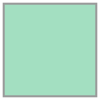

In [6]:
p1 = Polygon([[0,0],[0,1],[1,1],[1,0]])
print 'Compactness: {}'.format(compactness_measure(p1))
print 'Area to Perimeter {}'.format(p1.area/p1.length)
p1

Compactness: 0.785398163397
Area to Perimeter 1.0


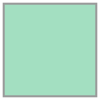

In [7]:
p2 = Polygon([[0,0],[0,4],[4,4],[4,0]])
print 'Compactness: {}'.format(compactness_measure(p2))
print 'Area to Perimeter {}'.format(p2.area/p2.length)
p2

Compactness: 0.326116884456
Area to Perimeter 0.882352941176


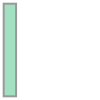

In [8]:
p3 = Polygon([[0,0],[0,15],[2,15],[2,0]])
print 'Compactness: {}'.format(compactness_measure(p3))
print 'Area to Perimeter {}'.format(p3.area/p3.length)
p3

Compactness: 0.999196680485
Area to Perimeter 0.998795456205


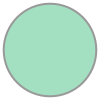

In [9]:
p4=Point(0,0).buffer(2)
print 'Compactness: {}'.format(compactness_measure(p4))
print 'Area to Perimeter {}'.format(p4.area/p4.length)
p4

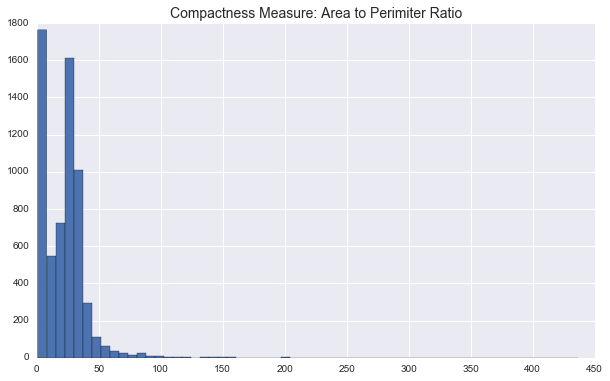

In [11]:
cp2 = blocks.area / blocks.length
fig, ax = plt.subplots()
cp2.hist(bins=60, ax=ax)
t=ax.set_title('Compactness Measure: Area to Perimiter Ratio', fontsize=14)

fig.set_size_inches(10,6)

Let's take the log of this to see what the distribution looks like: 

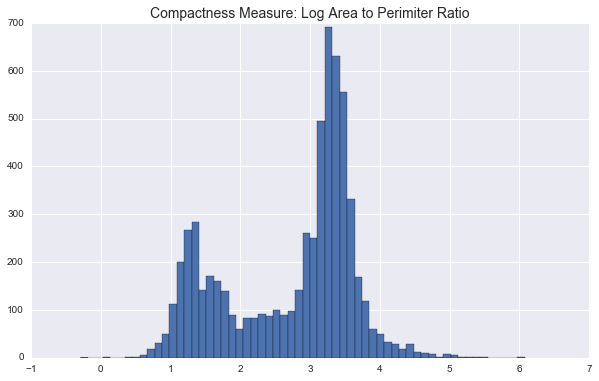

In [13]:
cp3 = np.log(cp2)
fig, ax = plt.subplots()
cp3.hist(bins=60, ax=ax)
t=ax.set_title('Compactness Measure: Log Area to Perimiter Ratio', fontsize=14)

fig.set_size_inches(10,6)

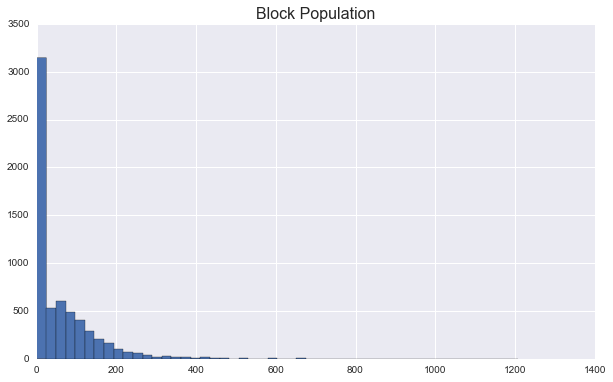

In [17]:
block_pop = pd.read_csv('Oakland_Block_Pop.csv', header=None, dtype={0:np.object}, names=['GEOID10','POP']).set_index("GEOID10")['POP']
fig, ax = plt.subplots()
block_pop.hist(bins=50, ax=ax)
fig.set_size_inches(10,6)

t=ax.set_title('Block Population',fontsize=16)

In [18]:
gdf = gpd.GeoDataFrame(geometry=blocks)
gdf['CP1']=cp1
gdf['CP2']=cp2
gdf['CP3']=cp3
gdf['POP']=block_pop
gdf.to_file('C:/Temp/a_b.shp')

Have decided that the log of area to perimeter ratio will work. Now decide the cutoff to use

In [61]:
def f(x):
    sliver_pop = ((cp3<x)&(block_pop>20)).sum()
    no_sliver_no_pop = ((cp3>=x)&(block_pop<=20)).sum()
    return sliver_pop + no_sliver_no_pop
minimize = minimize_scalar(f, bounds=(2,3), method='bounded').x
print minimize

2.87913410525


In [63]:
cut_off=minimize.round(1)
print cut_off

2.9


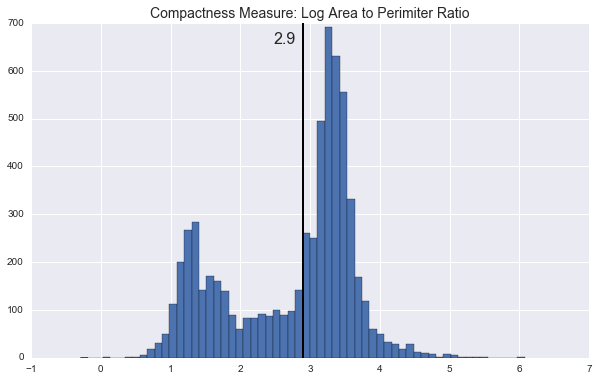

In [64]:
fig, ax = plt.subplots()
cp3.hist(bins=60, ax=ax)
t=ax.set_title('Compactness Measure: Log Area to Perimiter Ratio', fontsize=14)
tform = blended_transform_factory(ax.transData, ax.transAxes)
ax.axvline(cut_off, color='black', linewidth=2, linestyle='-')
ax.annotate(str(cut_off), xy=(2.8, 0), xycoords=tform, xytext=(cut_off-.1, 0.95), textcoords=tform,
            ha='right', va='center', fontsize=16)
fig.set_size_inches(10,6)

In [65]:
sliver_mask = (cp3<cut_off)
sliver_mask.sum()/float(len(sliver_mask))

0.40098694683221903

In [66]:
sliver_labels=sliver_mask.astype(int).map({0:'Not Sliver', 1:'Sliver'})
less_10 = (block_pop<=10).astype(int).map({0:'More than 10 Pop', 1:'Less than 10 Pop'})
s = pd.crosstab(sliver_labels, less_10)
s.index.name=None
s.columns.name=None
print 'Log (Area / Perimeter) - Sliver = <2.8'
s

Log (Area / Perimeter) - Sliver = <2.8


,Less than 10 Pop,More than 10 Pop
Not Sliver,591,3172
Sliver,2254,265


In [68]:
map1 = folium.Map(location=[37.822274, -122.260137], zoom_start=15, tiles='Stamen Toner')
slivers_wgs = blocks[sliver_mask].to_crs({'init': 'epsg:4326'})
non_slivers_wgs = blocks[~sliver_mask].to_crs({'init': 'epsg:4326'})


map1.choropleth(geo_str = slivers_wgs.to_json(), fill_color='red', line_opacity=0, line_weight=2, fill_opacity=0.5, line_color='yellow')
map1.choropleth(geo_str = non_slivers_wgs.to_json(), fill_color='blue', line_opacity=0, line_weight=2, fill_opacity=0.5, line_color='yellow')

map1    
    

